In [108]:
import numpy as np 
import pandas as pd 
from matplotlib import pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
import statsmodels.api as sm
from statsmodels.graphics.gofplots import ProbPlot
from sklearn import linear_model

In [2]:
from warnings import simplefilter
simplefilter(action='ignore', category=(FutureWarning, UserWarning))

In [26]:
path_to_raw_data = "../../data/raw_regression.csv"
path_to_preprocessed_data = "../../data/preprocessed_regression.csv"
data_raw = pd.read_csv(path_to_raw_data, sep=",")
data = pd.read_csv(path_to_preprocessed_data, sep=";")

In [27]:
data.shape

(256014, 43)

In [28]:
data.sample(5)

,ACS,AC,AI,BS,CALI,DEN,GR,NEU,RMED,DEPTH,...,DEN_window_max,GR_window_mean,GR_window_min,GR_window_max,NEU_window_mean,NEU_window_min,NEU_window_max,RMED_window_mean,RMED_window_min,RMED_window_max
114944,-1.058143,-0.657619,0.255642,-0.902426,-0.970923,-0.433333,-0.728700,-0.800619,-0.219093,3453.0792,...,-0.422941,-0.750858,-0.827352,-0.705871,-0.908293,-1.052176,-0.800619,-0.246908,-0.270669,-0.219093
154177,-1.006921,-0.758697,0.418478,-0.676348,-0.758555,-0.372507,-1.266555,-1.198057,-0.364489,3927.6528,...,-0.372507,-1.317067,-1.385855,-1.266555,-1.112549,-1.198057,-1.051727,-0.397498,-0.448964,-0.364489
108896,-0.323199,-0.154257,-0.445083,1.108124,1.110165,-1.239546,-0.817149,-0.238975,-0.506145,2184.8064,...,-0.551255,-0.699032,-0.817149,-0.552369,0.324908,-0.238975,0.885131,-0.474406,-0.506145,-0.448982
212213,0.537697,0.561005,-0.541033,0.875080,0.824730,-0.668484,-0.540740,0.154045,-0.137965,1384.7064,...,1.339084,-0.623795,-0.722905,-0.540740,0.485552,0.154045,0.786871,-0.106384,-0.137965,-0.064645
113882,-0.534506,-0.363477,0.326333,-0.902426,-0.896317,0.536956,0.948736,0.444278,-0.316451,3290.0112,...,0.788398,0.976150,0.762951,1.154366,0.849821,0.444278,1.084087,-0.251955,-0.316451,-0.207701


In [29]:
data.describe()

,ACS,AC,AI,BS,CALI,DEN,GR,NEU,RMED,DEPTH,...,DEN_window_max,GR_window_mean,GR_window_min,GR_window_max,NEU_window_mean,NEU_window_min,NEU_window_max,RMED_window_mean,RMED_window_min,RMED_window_max
count,2.560140e+05,2.560140e+05,2.560140e+05,2.560140e+05,256014.000000,256014.000000,2.560140e+05,256014.000000,2.560140e+05,256014.000000,...,256014.000000,2.560140e+05,256014.000000,256014.000000,256014.000000,256014.000000,256014.000000,2.560140e+05,256014.000000,256014.000000
mean,-5.847745e-16,-4.978506e-16,-2.261026e-15,-1.756087e-14,0.014124,-0.001117,8.400633e-17,0.001117,-7.810469e-17,2295.773431,...,0.128835,-3.785916e-07,-0.130029,0.130848,0.001122,-0.158274,0.167441,2.478099e-08,-0.050089,0.057965
std,1.000002e+00,1.000002e+00,9.994432e-01,9.398377e-01,0.999343,1.000001,9.807891e-01,1.000001,1.000002e+00,909.286411,...,0.999761,9.662296e-01,0.935742,1.019263,0.975965,0.946932,1.051746,9.297071e-01,0.708213,1.335176
min,-5.468026e+00,-5.744961e+00,-9.128072e+00,-3.026095e+00,-8.667426,-14.790361,-3.661775e+00,-6.918895,-3.334932e+00,226.466400,...,-12.564644,-3.223287e+00,-3.661775,-3.202925,-6.317023,-6.918895,-5.393445,-2.314251e+00,-3.334932,-2.087458
25%,-8.491937e-01,-7.848363e-01,-7.193168e-01,-6.777179e-01,-0.714709,-0.665683,-6.145805e-01,-0.667330,-2.452808e-01,1599.742800,...,-0.578212,-6.005406e-01,-0.734106,-0.469400,-0.650400,-0.803387,-0.543620,-2.444100e-01,-0.251511,-0.235519
50%,3.893212e-02,1.218623e-01,-2.104515e-01,0.000000e+00,-0.125067,-0.014983,0.000000e+00,0.161339,-1.354785e-01,2231.440800,...,0.102406,1.645906e-14,-0.120224,0.069521,0.161339,-0.016693,0.231972,-1.345084e-01,-0.148185,-0.121260
75%,7.703239e-01,8.001744e-01,5.659268e-01,7.252675e-01,0.794541,0.683942,4.783070e-01,0.668660,-3.829130e-02,3052.419600,...,0.828961,4.674505e-01,0.342983,0.613393,0.666697,0.549889,0.797751,-3.747318e-02,-0.055491,-0.021602
max,7.100198e+00,4.357866e+00,1.765087e+01,4.679744e+01,21.780015,14.352466,3.324592e+01,31.080754,9.877433e+01,4235.653200,...,14.352466,2.773115e+01,20.607618,33.245915,31.080512,31.080281,31.080754,4.986470e+01,31.570942,98.774334


In [30]:
wells = data['well_name'].unique()
print(wells)
print("Numer of wells: {}".format(len(wells)))

['30/6-26' '30/11-8 S' '25/4-9 S' '30/11-6 S' '25/7-4 S' '30/5-2'
 '25/10-16 A' '25/2-18 ST2' '25/10-16 S' '30/9-22' '25/10-15 S' '25/8-8 S'
 '30/11-9 ST2' '30/11-11 S' '30/11-7 A' '25/8-14 ST2' '30/8-5 T2'
 '30/11-7' '25/4-10 S' '25/10-16 C' '30/11-9 A' '25/10-12 ST2' '25/8-12 S'
 '25/5-9' '25/8-12 A' '25/2-18 A' '25/7-6' '25/5-5' '25/11-24' '25/5-6'
 '30/11-10' '25/6-4 S' '25/4-7' '25/4-13 A']
Numer of wells: 34


## Variables in dataset
The following borewell logs are considered
* ACS - shear wave velocity log (target variable)
* AC - compressional wave velocity log
* AI - acoustic impedance log
* BS - bit size (size of borehead(?))
* CALI - caliper, i.e the width of the borehole. Will deviate from BS if presence of a lot of loose materials
* DEN - density log
* GR - gamma ray log
* NEU - neutron density log
* RMED - electrical resistivity log
* DEPTH - depth in metres

In addition to the above variable, local gradients and rolling windows calculating mean, min and max are included in the set of explanatory variables.



In [31]:
pd.Series(data.columns.values)

0                  ACS
1                   AC
2                   AI
3                   BS
4                 CALI
5                  DEN
6                   GR
7                  NEU
8                 RMED
9                DEPTH
10           well_name
11         AC_gradient
12         AI_gradient
13         BS_gradient
14       CALI_gradient
15        DEN_gradient
16         GR_gradient
17        NEU_gradient
18       RMED_gradient
19      AC_window_mean
20       AC_window_min
21       AC_window_max
22      AI_window_mean
23       AI_window_min
24       AI_window_max
25      BS_window_mean
26       BS_window_min
27       BS_window_max
28    CALI_window_mean
29     CALI_window_min
30     CALI_window_max
31     DEN_window_mean
32      DEN_window_min
33      DEN_window_max
34      GR_window_mean
35       GR_window_min
36       GR_window_max
37     NEU_window_mean
38      NEU_window_min
39      NEU_window_max
40    RMED_window_mean
41     RMED_window_min
42     RMED_window_max
dtype: obje

### Distribution of target variable

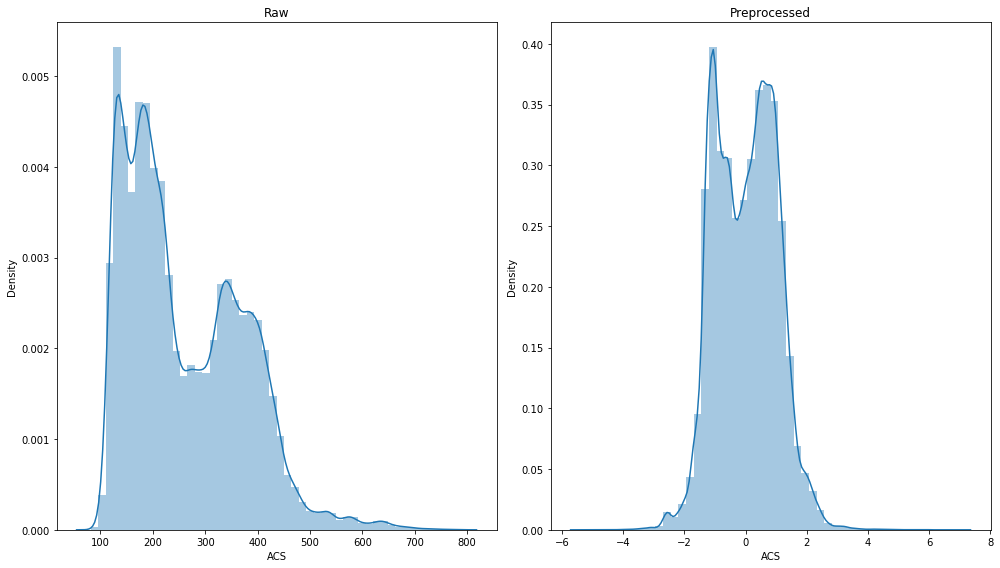

In [48]:
target_variable = "ACS"
fig, (ax1, ax2) = plt.subplots(1, 2, sharey=False, figsize=(14,8))
ax1.set_title("Raw")
sns.distplot(data_raw[target_variable], ax=ax1)
ax2.set_title("Preprocessed")
sns.distplot(data[target_variable], ax=ax2)
fig.tight_layout()

Note that the target variable is slightly bi-modal, otherwise seemingly normally distributed around 0. This is expected as the variable is scaled (well-wise). The shape of the pre-processed distorbution differs slightly as the scaling is performed in a well-wise manner. 

#### Look at the target variable in each well
The preprocessed, i.e. scaled data, is plotted in the left column. The raw data is plotted in the column to the right.

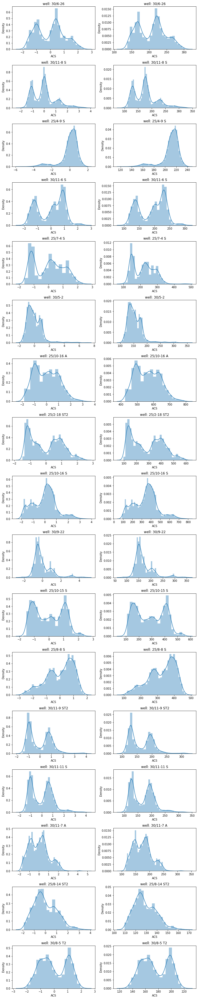

In [63]:
fig, axs = plt.subplots(len(wells)//2, 2, figsize=(10,50))
for well, ax in zip(wells, axs):
    data_well = data[data["well_name"] == well]
    data_well_raw = data_raw[data_raw["well_name"] == well]
    ax[0].set_title("well: {}".format(well))
    ax[1].set_title("well: {}".format(well))
    sns.distplot(data_well[target_variable], ax=ax[0])
    sns.distplot(data_well_raw[target_variable], ax=ax[1])
plt.tight_layout(pad=1)

From the plots above it is clear that the target variable is highly varying across wells. In some cases the distribution is highly bi-/multimodal, whereas in other wells the distibution is seemingly normally distributed. Note that the shape of the distribution is preserved after scaling.

The explanatory variables can hopefully describe the variation of the target variable.

#### Distribution of explanatory variables

In [67]:
variables = data.columns.values
explanatory_variables = [var for var in variables if var not in [target_variable, "well_name"]]
original_exp_vars = explanatory_variables[0:9]

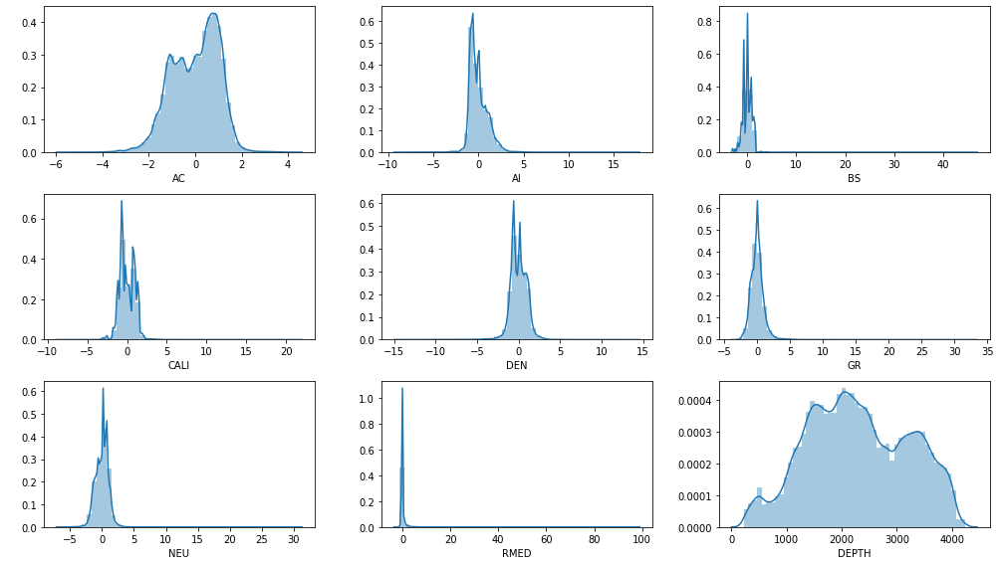

In [71]:
plt.figure(figsize=(14,8))
for i, var in enumerate(original_exp_vars):
    plt.subplot(3, 3, i+1)
    plt.ylabel(" ")
    values = data[var]
    sns.distplot(values)
plt.tight_layout()

The original explanatory variables (not engineered) shows some signs of multimodality, however they are seemingly approximately normally distributed. \
RMED shows the least variability of the variables, while AC shows the most (excluding depth).

### Scatterplot matrices, and correlation between variables

In [73]:
def corrfunc(x, y, ax=None, **kws):
    "Plot Pearson correlation coefficient in top legt corner of a plot"
    r, _ = pearsonr(x, y)
    ax = ax or plt.gca()
    ax.annotate(f'ρ = {r:.2f}', xy=(.1, .9), xycoords=ax.transAxes)

Consider a random sample of 10000 samples to plot the scatter matrices

In [75]:
num_samples = 10000
sampled_data = data.sample(num_samples)

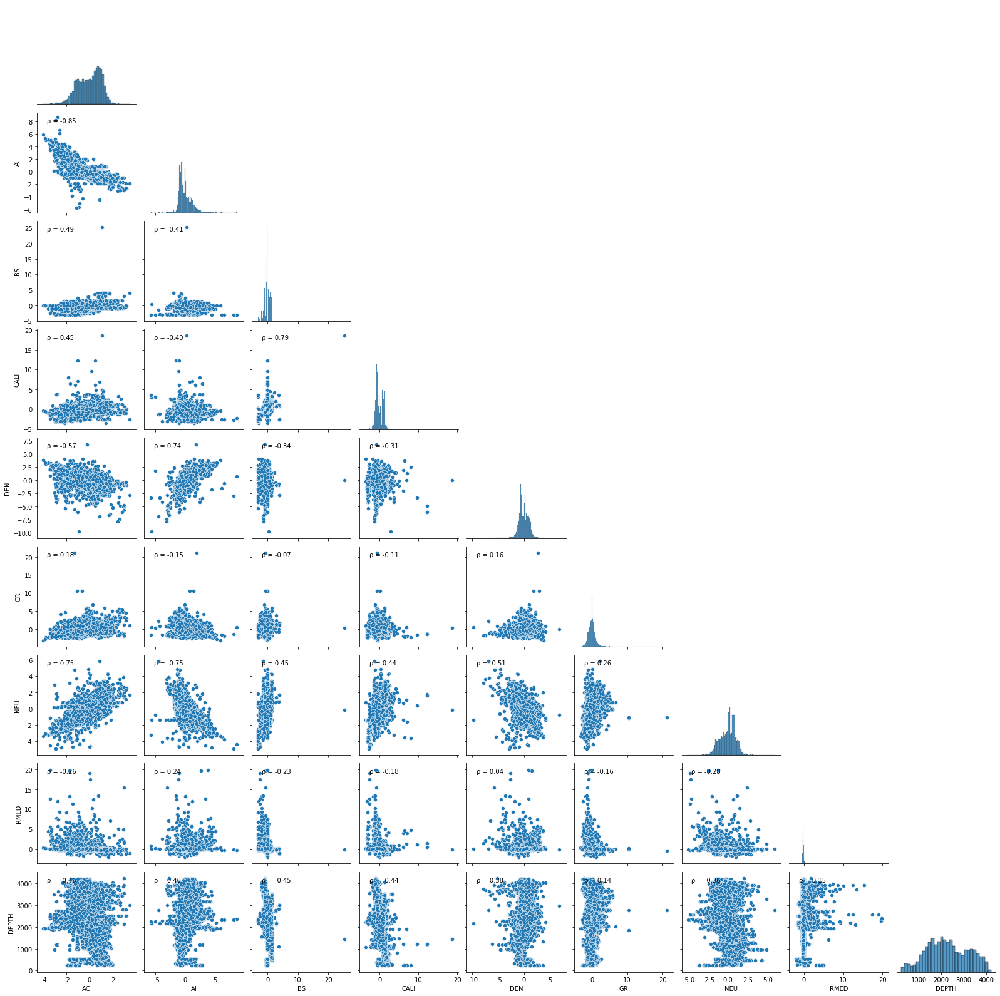

In [76]:
g = sns.pairplot(sampled_data,vars=original_exp_vars,corner=True)
g.map_lower(corrfunc)


In [78]:
data[original_exp_vars].corr(method='pearson')

,AC,AI,BS,CALI,DEN,GR,NEU,RMED,DEPTH
AC,1.000000,-0.842185,0.485326,0.449916,-0.581999,0.164065,0.744236,-0.218453,-0.471840
AI,-0.842185,1.000000,-0.405389,-0.413856,0.754602,-0.146858,-0.747745,0.205529,0.410586
BS,0.485326,-0.405389,1.000000,0.772590,-0.344649,-0.082318,0.439440,-0.181975,-0.451510
CALI,0.449916,-0.413856,0.772590,1.000000,-0.333780,-0.107775,0.449459,-0.154015,-0.433776
DEN,-0.581999,0.754602,-0.344649,-0.333780,1.000000,0.165876,-0.513347,0.026153,0.386435
GR,0.164065,-0.146858,-0.082318,-0.107775,0.165876,1.000000,0.244957,-0.120323,0.140373
NEU,0.744236,-0.747745,0.439440,0.449459,-0.513347,0.244957,1.000000,-0.224207,-0.372089
RMED,-0.218453,0.205529,-0.181975,-0.154015,0.026153,-0.120323,-0.224207,1.000000,0.131963
DEPTH,-0.471840,0.410586,-0.451510,-0.433776,0.386435,0.140373,-0.372089,0.131963,1.000000


The following sets of variables are correlated with a correlation coefficient greater than 0.5;

AC and {AI, DEN, NEU} \
AI and {AC, DEN, NEU} \
BS and {CALI} - this is expected \
CALI and {BS} \
DEN and {AC, AI, NEU} \
GR and {} \
NEU and {AC, AI, DEN} \
RMED and {} \
DEPTH and {} 

The below plot is a scatterplot matrix of all the variables in the dataset, i.e including the engineered features.

In [80]:
g = sns.pairplot(sampled_data,vars=explanatory_variables,corner=True)
g.map_lower(corrfunc)

In [81]:
data[explanatory_variables].corr(method='pearson')

,AC,AI,BS,CALI,DEN,GR,NEU,RMED,DEPTH,AC_gradient,...,DEN_window_max,GR_window_mean,GR_window_min,GR_window_max,NEU_window_mean,NEU_window_min,NEU_window_max,RMED_window_mean,RMED_window_min,RMED_window_max
AC,1.000000,-0.842185,0.485326,0.449916,-0.581999,0.164065,0.744236,-2.184533e-01,-0.471840,-0.000027,...,-0.593744,0.162416,0.181969,0.139730,0.755145,0.751595,0.726150,-0.235618,-0.262378,-0.191722
AI,-0.842185,1.000000,-0.405389,-0.413856,0.754602,-0.146858,-0.747745,2.055287e-01,0.410586,0.000152,...,0.731891,-0.147150,-0.163971,-0.127485,-0.756947,-0.747814,-0.732331,0.221112,0.250775,0.177497
BS,0.485326,-0.405389,1.000000,0.772590,-0.344649,-0.082318,0.439440,-1.819754e-01,-0.451510,0.004065,...,-0.396173,-0.083561,-0.064669,-0.099154,0.449603,0.468734,0.413587,-0.195285,-0.203379,-0.169375
CALI,0.449916,-0.413856,0.772590,1.000000,-0.333780,-0.107775,0.449459,-1.540155e-01,-0.433776,-0.000478,...,-0.368523,-0.108659,-0.092493,-0.121253,0.460144,0.468916,0.432727,-0.165695,-0.167568,-0.146646
DEN,-0.581999,0.754602,-0.344649,-0.333780,1.000000,0.165876,-0.513347,2.615273e-02,0.386435,-0.002498,...,0.933042,0.162764,0.151177,0.169394,-0.516046,-0.500860,-0.508221,0.032996,0.067007,0.005577
GR,0.164065,-0.146858,-0.082318,-0.107775,0.165876,1.000000,0.244957,-1.203227e-01,0.140373,-0.008412,...,0.163468,0.977086,0.962144,0.965067,0.243632,0.249851,0.225602,-0.125929,-0.132367,-0.107976
NEU,0.744236,-0.747745,0.439440,0.449459,-0.513347,0.244957,1.000000,-2.242069e-01,-0.372089,-0.004610,...,-0.506531,0.242712,0.255962,0.223322,0.967193,0.945056,0.946649,-0.242028,-0.275665,-0.192521
RMED,-0.218453,0.205529,-0.181975,-0.154015,0.026153,-0.120323,-0.224207,1.000000e+00,0.131963,-0.006789,...,0.047318,-0.118809,-0.126798,-0.107753,-0.227375,-0.236253,-0.209841,0.905004,0.845722,0.866225
DEPTH,-0.471840,0.410586,-0.451510,-0.433776,0.386435,0.140373,-0.372089,1.319627e-01,1.000000,0.000117,...,0.401838,0.142301,0.128834,0.151495,-0.381227,-0.341702,-0.404671,0.141947,0.146723,0.124850
AC_gradient,-0.000027,0.000152,0.004065,-0.000478,-0.002498,-0.008412,-0.004610,-6.789253e-03,0.000117,1.000000,...,0.054262,-0.026286,-0.026121,-0.021550,-0.050147,-0.046898,-0.043391,-0.003973,0.001000,-0.006894


AC highly correlated with its corresponding windows, as well as the window variables for AI, NEU and DEN (which AC is correlated with). This is because a variable is highly correlated with its corresponding window functions, and the observed correlation might be spurious. 

This is also observed for the other sets of variables;

A variable is not correlating with its gradient (close to 0 correlation), but almost perfectly correlating with its window variables.

If a variable shows strong correlation with another variable, the variable shows strong correlation with the window variables of the variable it correlates with. This is a spurious correlation. 

## Fit a linear model and make diagonistic plots
consider the randomly sampled data (10 000 samples)

In [97]:
X = sampled_data[explanatory_variables]
y = sampled_data[target_variable]
print(X.shape)
print(y.shape)

(10000, 41)
(10000,)


In [98]:
model = sm.OLS(y, sm.add_constant(X))
model_fit = model.fit()
df = pd.concat([X, y], axis=1)

In [106]:
model_fitted_y = model_fit.fittedvalues
model_residuals = model_fit.resid
model_norm_residuals = model_fit.get_influence().resid_studentized_internal
model_norm_residuals_abs_sqrt = np.sqrt(np.abs(model_norm_residuals))
model_abs_resid = np.abs(model_residuals)

### Residuals vs fitted values
check for any non-linearity 

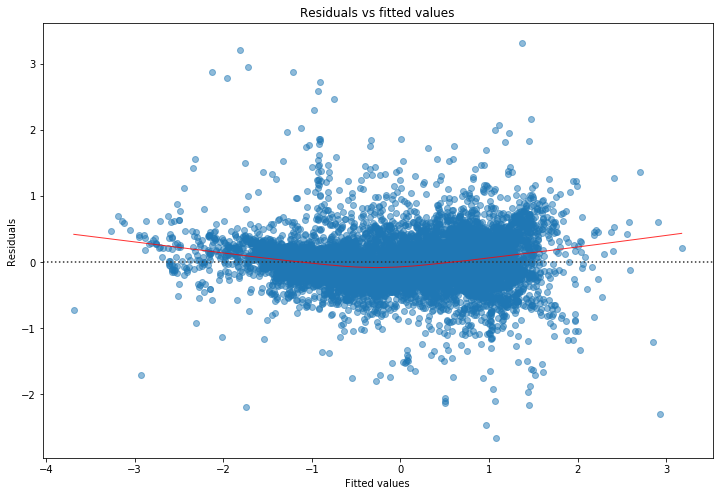

In [110]:
plt_lm_1 = plt.figure(figsize=(12, 8))
plt_lm_1.axes[0] = sns.residplot(model_fitted_y, df.columns[-1], 
                                  data=df,lowess=True, scatter_kws={'alpha':0.5},
                                 line_kws={'color':'red','lw':1, 'alpha':0.8})
plt_lm_1.axes[0].set_title('Residuals vs fitted values')
plt_lm_1.axes[0].set_xlabel('Fitted values')
plt_lm_1.axes[0].set_ylabel('Residuals');


There seems to be some kind of non-linear relationship in the residuals. This suggest to include non-linearities in the model, as the model fails to capture non-linear relationships between the target and explanatory variables. When a linear model fails to capture non-linear relationships as such, the non-linearity shows up in the residuals as here. 

### Scale-location plot
check for any heteroscedasticity

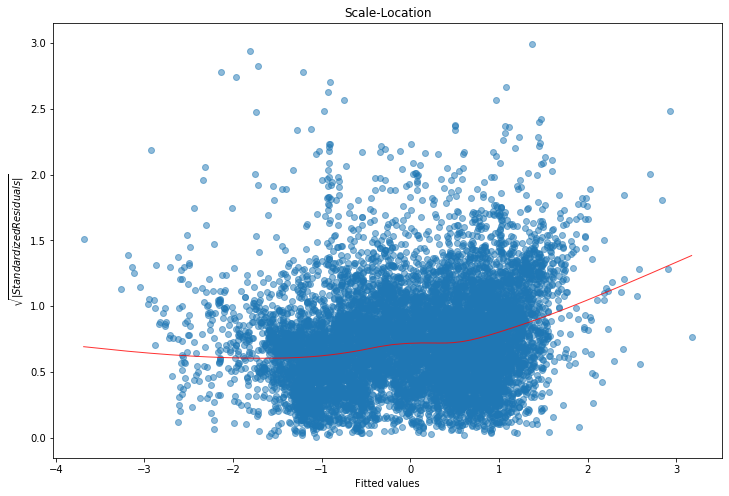

In [111]:
plt_lm_2 = plt.figure(figsize=(12, 8))
plt.scatter(model_fitted_y, model_norm_residuals_abs_sqrt, alpha=0.5)
sns.regplot(model_fitted_y, model_norm_residuals_abs_sqrt,
           scatter=False,
           ci=False,
           lowess=True, 
           line_kws={'color':'red', 'lw':1, 'alpha':0.8})
plt_lm_2.axes[0].set_title('Scale-Location')
plt_lm_2.axes[0].set_xlabel('Fitted values')
plt_lm_2.axes[0].set_ylabel('$\sqrt{|Standardized Residuals|}$');

The scale-location plot shows a clear trend in the studentized residuals, which suggest that the noise model is heteroscedastic. We see that the residuals increase as the fitted values increase, suggesting heteroscedastic noise.

## QQ-plot
check for normality of residuals, which are estimates of the error

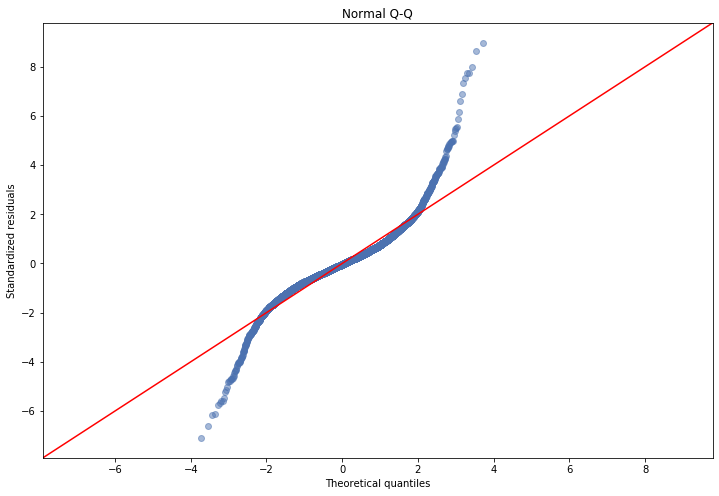

In [113]:
QQ = ProbPlot(model_norm_residuals)
plt_lm_3 = QQ.qqplot(line='45', alpha=0.5, color='#4C72B0', lw=1)
plt_lm_3.set_figwidth(12)
plt_lm_3.set_figheight(8)
plt_lm_3.axes[0].set_title('Normal Q-Q')
plt_lm_3.axes[0].set_xlabel('Theoretical quantiles')
plt_lm_3.axes[0].set_ylabel('Standardized residuals');

The empirical quantiles of the residuals are far off the diagonal line, and thus not normally distribution with zero mean and unit variance (standard normal). The distribution of the residuals appear heavy-tailed.

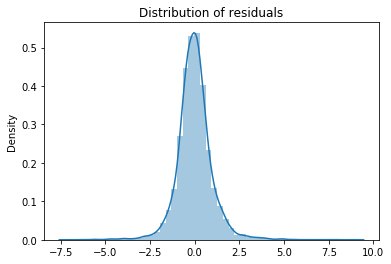

In [116]:
plt.figure()
plt.title('Distribution of residuals')
sns.distplot(model_norm_residuals);

The apparent heavy-tailedness from the qq-plot is confirmed from the density plot of the normalized residuals

## Setting up a mathematical model

The below model aims to model the shear wave velocity $y_i$ given a set of well-log measurements $\bf{x_i}$ for sample $i = 1, ..., N$. The relationship between the explanatory variables $\bf{x_i}$ and the target variable $y_i$ is assumed to be non-linear and modelled by a feedforward neural network $f(\bf{x_i}, \phi)$. A heteroscedastic noise model $g(\bf{x_i}, \psi)$ is assumed, meaning that the noise is input-dependent. Each sample is thus assumed to be concerned with a separate level of noise. These two assumptions are drawn from the diagnostic plots above.


\begin{equation}
    \begin{split}
        & y_i = z_i + \varepsilon_i \in \mathbb{R}, \; i = 1, ..., N \\
        & z_i = f(\bf{x_i}, \phi) \in \mathbb{R}, \; i = 1, ..., N \\
        & \varepsilon_i \sim \mathcal{N}(0, s_i^2) \in \mathbb{R}, \; i = 1, ..., N \\
        & s_i = g(x_i, \phi), \; i = 1, ..., N
    \end{split}
\end{equation}

The parameters $\phi, \psi$ are the parameters of the neural network and the noise model. For a fully Bayesian treatment we need to specify prior distributions for both sets of parameters. The distribution of the parameters are the updated using VI during training, approximating the corresponding posterior distirbutions